<a href="https://colab.research.google.com/github/AzisilhamK463/PCVK_2023/blob/main/week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Azis Ilham Kurniawan / 2141720145

# Praktikum

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

In [ ]:
def convolution2d(image, kernel, stride, padding):
  image = np.pad(image, padding, mode='constant', constant_values=0)

  output_height = (image.shape[0] - kernel.shape[0]) // stride + 1
  output_width = (image.shape[1] - kernel.shape[1]) // stride + 1

  image_result = np.zeros((output_height, output_width))
  for y in range (0, output_height):
    for x in range (0, output_width):
      image_result[y][x] = np.sum(image[y * stride:y * stride + kernel.shape[0], x * stride:x * stride + kernel.shape[1]] * kernel)

  return image_result

In [ ]:
img = cv.imread('/content/drive/MyDrive/dataset/female.tiff')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

kernel_sharpen = np.array([[0, -1, 0],
                          [-1, 5, -1],
                          [0, -1, 0]])

**Sharpen**

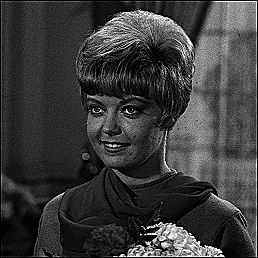

In [ ]:
cv2_imshow(convolution2d(img_gray, kernel_sharpen,1 ,2))

**Emboss**

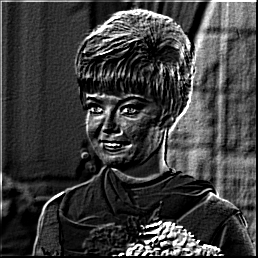

In [ ]:
kernel_emboss = np.array([[-2, -1, 0],
                          [-1, 1, 1],
                          [0, 1, 2]])

cv2_imshow(convolution2d(img_gray, kernel_emboss, 1, 2))

**Left Sobel Edge Detection**

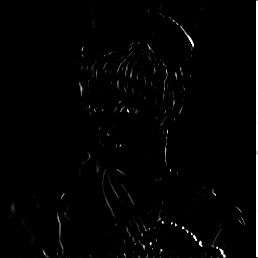

In [ ]:
kernel_lsed = np.array([[1, 0, -1],
                          [2, 0, -3],
                          [1, 0, -2]])

cv2_imshow(convolution2d(img_gray, kernel_lsed, 1, 2))

**Canny Edge Detection**

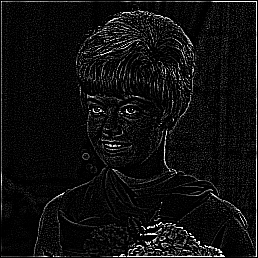

In [ ]:
kernel_ced = np.array([[-1, -1, -1],
                          [-1, 8, -1],
                          [-1, -1, -1]])

cv2_imshow(convolution2d(img_gray, kernel_ced, 1, 2))

**Prewitt Edge Detection**

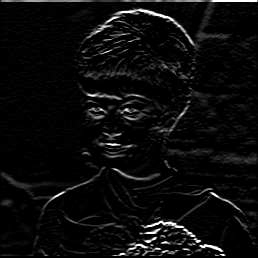

In [ ]:
kernel_ped = np.array([[-1, -1, -1],
                          [0, 0, 0],
                          [1, 1, 1]])

cv2_imshow(convolution2d(img_gray, kernel_ped, 1, 2))

**5 x 5 Gaussian Blur**

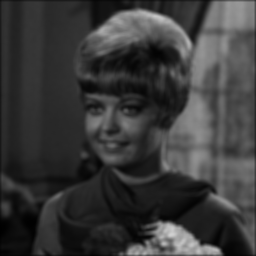

In [ ]:
kernel_size = 5
sigma=math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel@ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel, 1, 2))

**21 x 21 Gaussian Blur**

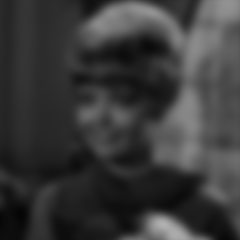

In [ ]:
kernel_size = 21
sigma=math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel@ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel, 1, 2))

#**Tugas Praktikum**

In [28]:
def Brightness (image, brightness):
  brightness_image = np.zeros(image.shape, image.dtype)

  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      for c in range(image.shape[2]):
        brightness_image[y,x,c] = np.clip(image[y,x,c] + brightness, 0, 255)

  return brightness_image

def hist_equ (image):
  channels = cv.split(image)
  eq_channels = []
  for ch, color in zip(channels, ["r", "g", "b"]):
    eq_channels.append(cv.equalizeHist(ch))

  eq_image = cv.merge(eq_channels)

  return eq_image

def conv2d(image, kernel, stride):

  height, width = image.shape[0], image.shape[1]
  kernel_height, kernel_width = kernel.shape[0], kernel.shape[1]

  start = int(kernel_width/2)

  image_result = np.copy(image)

  for y in range(start, height - start, stride):
    for x in range(start, width - start, stride):
      value = 0

      for ky in range(kernel_height):
        for kx in range(kernel_width):
          i = y - start + ky
          j = x - start + kx

          value += image[i, j] * kernel[ky, kx]

      image_result[y, x] = np.clip(value, 0, 255)

    return image_result

kernel_sharpen = np.array([[0, -1, 0],
                          [-1, 5, -1],
                          [0, -1, 0]], dtype = np.float32)

In [29]:
ktp1 = cv.imread('/content/drive/MyDrive/KTP.png')

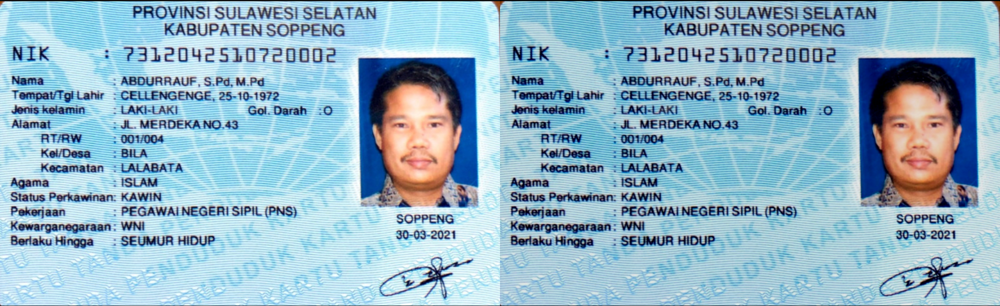

In [30]:
kernel_size = 5
sigma=math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel@ gaussian_kernel.transpose()

result_brightness = Brightness(ktp1, -25)

result = conv2d(result_brightness, gauss_kernel,1)

final_frame = cv.hconcat((ktp1, result))
cv2_imshow(final_frame)

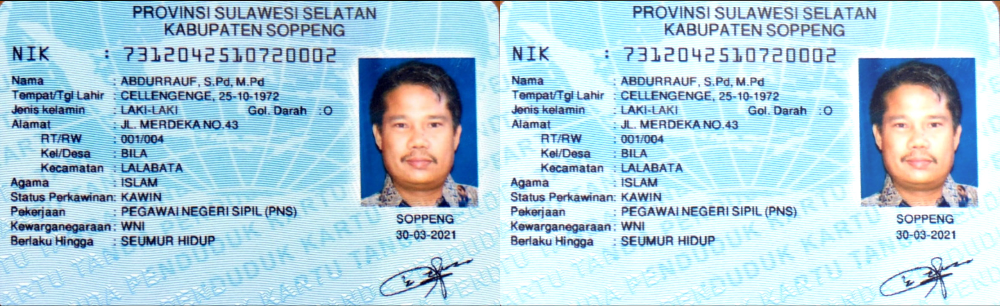

In [31]:
ktp2 = cv.imread('/content/drive/MyDrive/KTP.png')
result = conv2d(ktp2, kernel_sharpen,1)
brightness = Brightness(result, 35)
final_frame = cv.hconcat((ktp2, brightness))
cv2_imshow(final_frame)

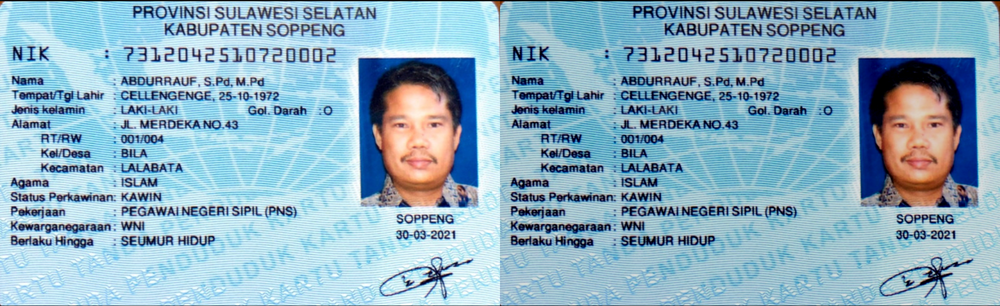

In [32]:
ktp3 = cv.imread('/content/drive/MyDrive/KTP.png')

kernel_lsed = np.array([[1, 0, -1],
                          [2, 0, -3],
                          [1, 0, -2]], dtype=np.float32)

# cv2_imshow(ktp3)
result = conv2d(ktp3, kernel_lsed,1)
brightness = Brightness(result, -35)
final_frame = cv.hconcat((ktp3, brightness))
cv2_imshow(final_frame)

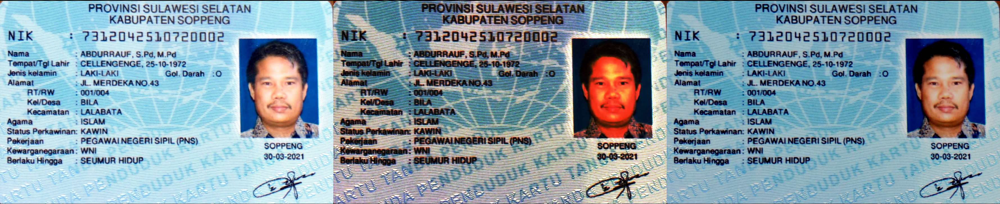

In [33]:
ktp4 = cv.imread('/content/drive/MyDrive/KTP.png')

# cv2_imshow(ktp4)
kernel_ped = np.array([[-1, -1, -1],
                          [0, 0, 0],
                          [1, 1, 1]], dtype=np.float32)

result = conv2d(ktp4, kernel_ped,1)
hist = hist_equ(result)
brightness = Brightness(result, -50)
final_frame = cv.hconcat((ktp4, hist, brightness))
cv2_imshow(final_frame)

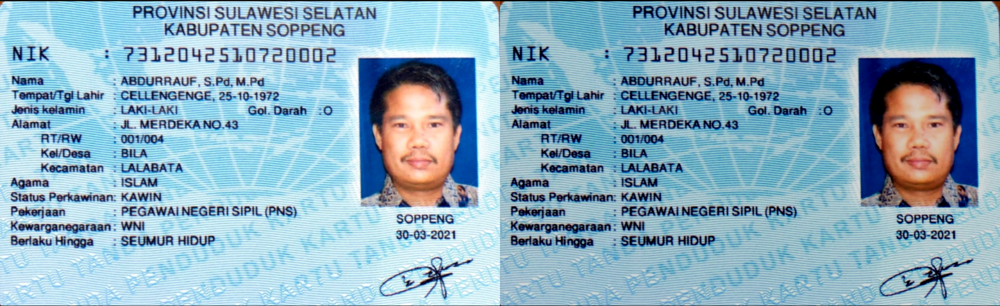

In [34]:
ktp5 = cv.imread('/content/drive/MyDrive/KTP.png')

kernel_emboss = np.array([[-2, -1, 0],
                          [-1, 1, 1],
                          [0, 1, 2]], dtype=np.float32)

result = conv2d(ktp5, kernel_sharpen,1)
ced = conv2d(result, kernel_ced,1)
brightness = Brightness(ced, -40)
final_frame = cv.hconcat((ktp5, brightness))
cv2_imshow(final_frame)

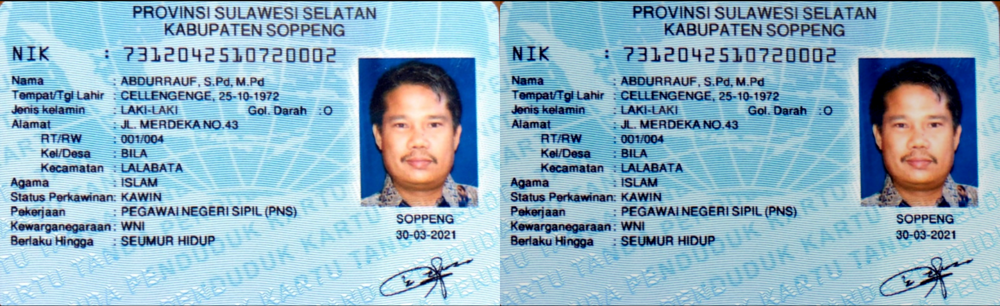

In [35]:
ktp6 = cv.imread('/content/drive/MyDrive/KTP.png')

kernel_size = 21
sigma=math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel@ gaussian_kernel.transpose()

result = conv2d(ktp6, gauss_kernel,1)
brightness = Brightness(result, -30)
final_frame = cv.hconcat((ktp6, brightness))
cv2_imshow(final_frame)

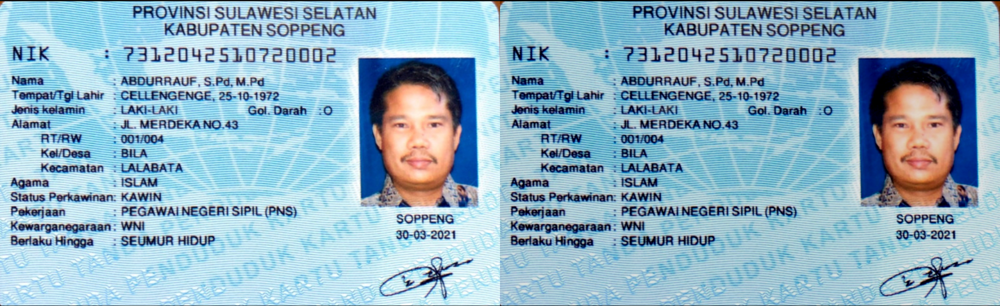

In [36]:
ktp7 = cv.imread('/content/drive/MyDrive/KTP.png')

result = conv2d(ktp7, kernel_lsed,1)
brightness = Brightness(result, -30)
final_frame = cv.hconcat((ktp7, brightness))
cv2_imshow(final_frame)

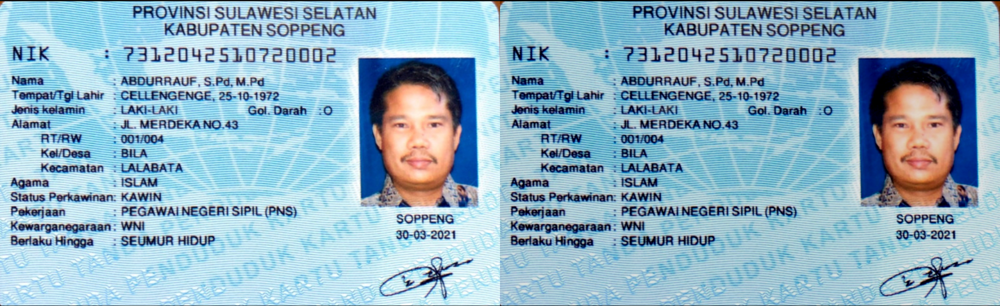

In [37]:
ktp8 = cv.imread('/content/drive/MyDrive/KTP.png')

result = conv2d(ktp8, kernel_ped,1)
brightness = Brightness(result, -30)
final_frame = cv.hconcat((ktp8, brightness))
cv2_imshow(final_frame)